# Holistic Path Discovery
In this notebook we document trials and other attempts leading up to the findings in [Holistic Path](HolisticPath.ipynb). While the results in this notebook may not used in the final report, they are still interesting to look at and may provide some insight into the final results and the process of discovery.

## Is the network able to overfit on a single or few path(s)?
In this experiment we want to know whether the network is complex enough that it atleast can overfit to the problem for a single path. We will use the same network as in [Holistic Path](HolisticPath.ipynb) and train it on a single path. We will then test it on the same path and see if it can predict the correct path. Below is the platform configuration used for this experiment.

### HP_OVERFIT_TEST_SINGLETON
See the results in [this directory](runs/HP_OVERFIT_TEST_SINGLETON).

In [1]:
from fedswarm import Platform

In [2]:
config = {
    "data": {
        "path": "/mnt/ZOD",
        "version": "full",
        "ratio": 1,
        "img_size": [400,1420],
        "transforms": "[CustomCrop(800, 500, 800, 2840), Resize((400, 1420))]",
        "shuffle_seed": 42,
        "decentralised_shuffle_seed": 42,
        "dataloader_args": {
            "batch_size": 32
        },
        "train_val_id_generator": "overfit_turn",
        "dataset_getitem": "interpolated_target_distances"
    },
    "model": {
        "name": "ptnet",
        "args": {
            "num_output": 51
        },
        "loss": "L1Loss"
    },
    "central": {
        "train": "true",
        "use_gpu": "true",
        "epochs": 300
    }
}


platform = Platform(config)

No same run found, creating new run


Loading train frames:   0%|          | 0/89976 [00:00<?, ?it/s]

Loading val frames:   0%|          | 0/10024 [00:00<?, ?it/s]

/home/alex/miniconda3/envs/swarm/lib/python3.10/site-packages/torch/nn/modules/loss.py:101: UserWarning: Using a target size (torch.Size([1, 51])) that is different to the input size (torch.Size([51])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.l1_loss(input, target, reduction=self.reduction)
/home/alex/miniconda3/envs/swarm/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/alex/miniconda3/envs/swarm/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


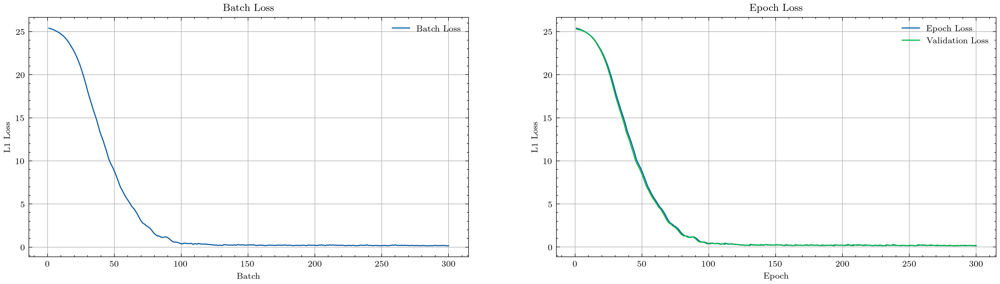

In [6]:
import matplotlib.pyplot as plt
import scienceplots
from tbparse import SummaryReader

plt.style.use('science')
plt.rcParams['figure.dpi'] = 300
plt.rcParams["figure.figsize"] = (16,4)
plt.rcParams.update({'font.size': 8})

reader = SummaryReader("runs/HP_OVERFIT_TEST_SINGLETON/", extra_columns=set(["dir_name"]))
df = reader.scalars
batch_loss = df.where(df["tag"] == "centralised/loss/batch").dropna()[["step", "value"]]
epoch_loss = df.where(df["tag"] == "centralised/loss/epoch").dropna().pivot(index="step", columns="dir_name", values="value")

plt.subplot(121)
plt.plot(batch_loss["step"], batch_loss["value"], label="Batch Loss")
plt.xlabel("Batch"), plt.ylabel("L1 Loss"), plt.legend(), plt.title("Batch Loss"), plt.grid()

plt.subplot(122)
plt.plot(epoch_loss.index, epoch_loss, label=["Epoch Loss", "Validation Loss"])
plt.xlabel("Epoch"), plt.ylabel("L1 Loss"), plt.legend(), plt.title("Epoch Loss"), plt.grid()
plt.show()

In [4]:
from fedswarm.utils.data.utils.oxts import plot_predictions, present_predictions
from fedswarm.utils.models.model_manager import load_model_from_checkpoint

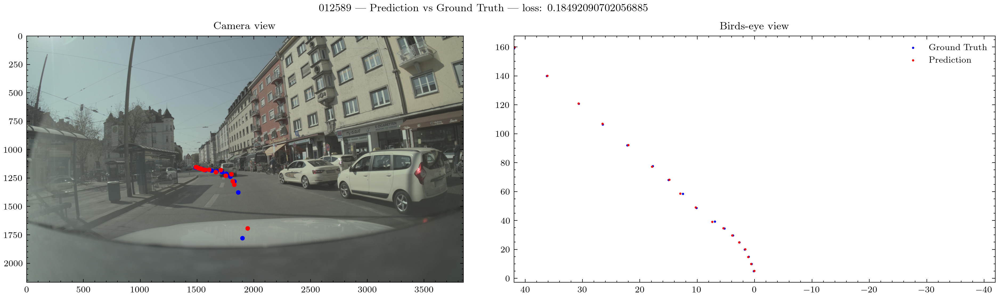

In [5]:
model = load_model_from_checkpoint("runs/HP_OVERFIT_TEST_SINGLETON/centralised_ptnet.pth", config)
zod_frames = platform.data.zod_frames
dataset = platform.data.central.train.dataset
i = 0
frame_id = platform.data.central.train.dataset.frames_id_set[i]

img, loss, ground_truth, output = plot_predictions(model, zod_frames, dataset, i)
present_predictions(img, loss, ground_truth, output, frame_id)

### HP_OVERFIT_TEST_FEW
See the results in [this directory](runs/HP_OVERFIT_TEST_FEW).

In [7]:
from fedswarm import Platform

In [8]:
config = {
    "data":{
        "path": "/mnt/ZOD",
        "version":"full",
        "ratio":0.001,
        "img_size": [400, 1420],
        "transforms":"[CustomCrop(800, 500, 800, 2840), Resize((400, 1420))]",
        "shuffle_seed": 42,
        "decentralised_shuffle_seed": 42,
        "dataloader_args": {
            "batch_size": 32,
        },
        "train_val_id_generator":"balanced_frames",
        "dataset_getitem":"interpolated_target_distances",
    },
    "model":{
        "name": "ptnet",
        "args": {
            "num_output":51
        },
        "loss":"L1Loss"
    },
    "central":{
        "train":"true",
        "use_gpu":"true",
        "epochs": 100
    }
}

platform = Platform(config)

No same run found, creating new run


Loading train frames:   0%|          | 0/89976 [00:00<?, ?it/s]

Loading val frames:   0%|          | 0/10024 [00:00<?, ?it/s]

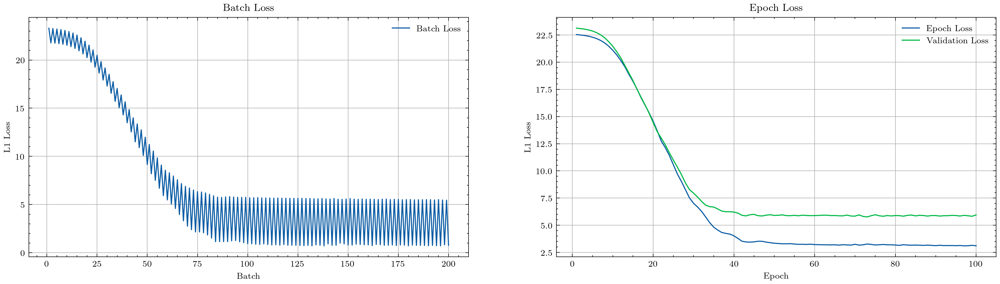

In [10]:
import matplotlib.pyplot as plt
import scienceplots
from tbparse import SummaryReader

plt.style.use('science')
plt.rcParams['figure.dpi'] = 300
plt.rcParams["figure.figsize"] = (16,4)
plt.rcParams.update({'font.size': 8})

reader = SummaryReader("runs/HP_OVERFIT_TEST_FEW/", extra_columns=set(["dir_name"]))
df = reader.scalars
batch_loss = df.where(df["tag"] == "centralised/loss/batch").dropna()[["step", "value"]]
epoch_loss = df.where(df["tag"] == "centralised/loss/epoch").dropna().pivot(index="step", columns="dir_name", values="value")

plt.subplot(121)
plt.plot(batch_loss["step"], batch_loss["value"], label="Batch Loss")
plt.xlabel("Batch"), plt.ylabel("L1 Loss"), plt.legend(), plt.title("Batch Loss"), plt.grid()

plt.subplot(122)
plt.plot(epoch_loss.index, epoch_loss, label=["Epoch Loss", "Validation Loss"])
plt.xlabel("Epoch"), plt.ylabel("L1 Loss"), plt.legend(), plt.title("Epoch Loss"), plt.grid()
plt.show()

We can see here that the network is seemingly somewhat unable to overfit to the problem. The mean loss converges to a value of around 2.5, which is not ideal. Let's look at some of the predictions and confirm visually that the network is not able to overfit to the problem.

In [11]:
from fedswarm.utils.data.utils.oxts import plot_predictions, present_predictions
from fedswarm.utils.models.model_manager import load_model_from_checkpoint

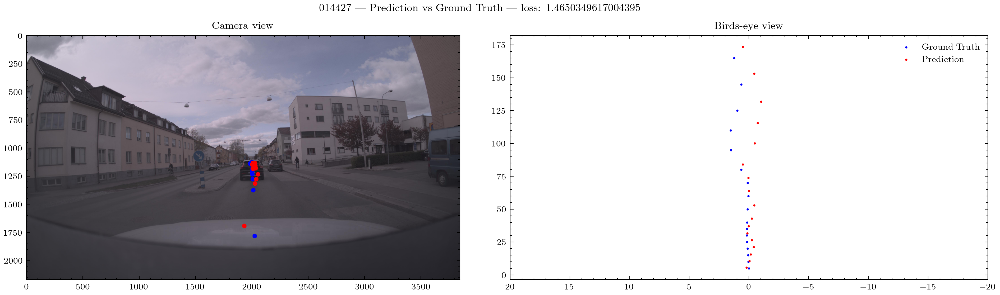

In [12]:
model = load_model_from_checkpoint("runs/HP_OVERFIT_TEST_FEW/centralised_ptnet.pth", config)
zod_frames = platform.data.zod_frames
dataset = platform.data.central.train.dataset
i = 0
frame_id = platform.data.central.train.dataset.frames_id_set[i]

img, loss, ground_truth, output = plot_predictions(model, zod_frames, dataset, i)
present_predictions(img, loss, ground_truth, output, frame_id)

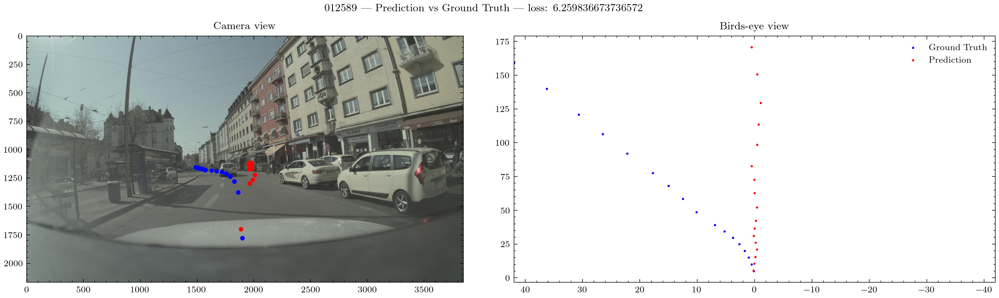

In [13]:
i = 1
frame_id = platform.data.central.train.dataset.frames_id_set[i]
img, loss, ground_truth, output = plot_predictions(model, zod_frames, dataset, i)
present_predictions(img, loss, ground_truth, output, frame_id)

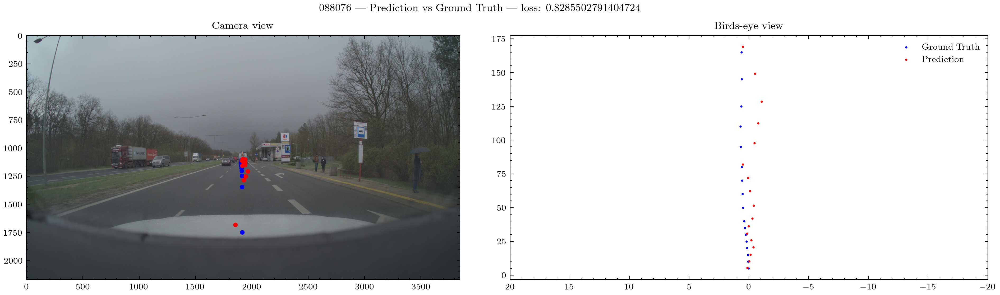

In [14]:
i = 3
frame_id = platform.data.central.train.dataset.frames_id_set[i]
img, loss, ground_truth, output = plot_predictions(model, zod_frames, dataset, i)
present_predictions(img, loss, ground_truth, output, frame_id)

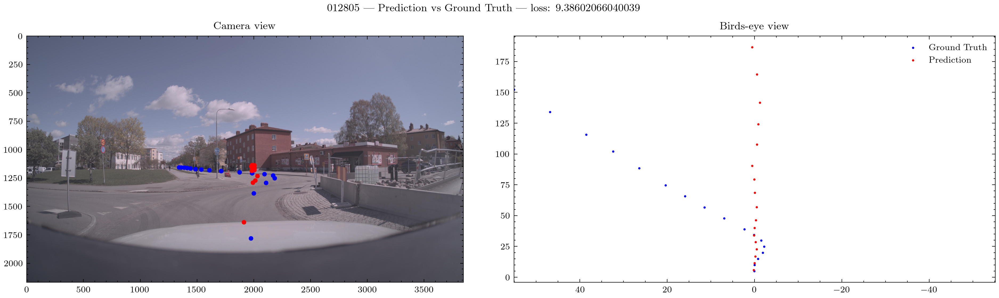

In [15]:
i = 4
frame_id = platform.data.central.train.dataset.frames_id_set[i]
img, loss, ground_truth, output = plot_predictions(model, zod_frames, dataset, i)
present_predictions(img, loss, ground_truth, output, frame_id)

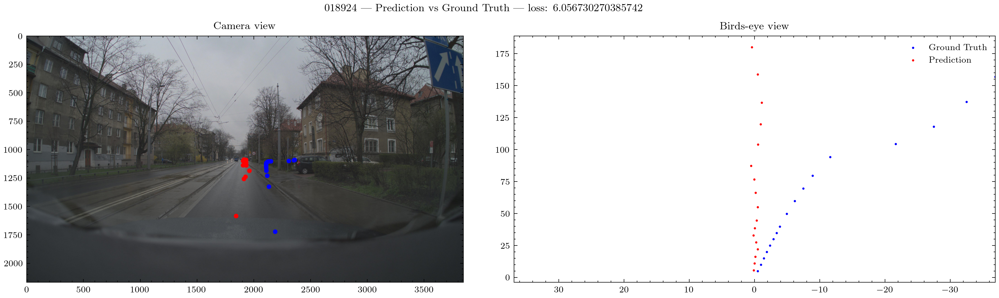

In [16]:
i = 6
frame_id = platform.data.central.train.dataset.frames_id_set[i]
img, loss, ground_truth, output = plot_predictions(model, zod_frames, dataset, i)
present_predictions(img, loss, ground_truth, output, frame_id)

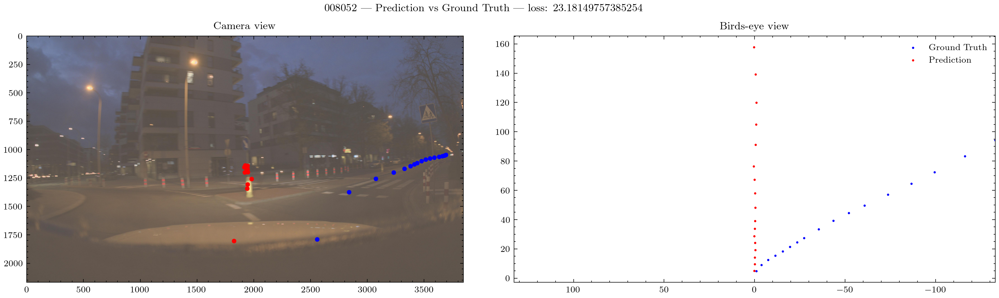

In [17]:
i = 8
frame_id = platform.data.central.train.dataset.frames_id_set[i]
img, loss, ground_truth, output = plot_predictions(model, zod_frames, dataset, i)
present_predictions(img, loss, ground_truth, output, frame_id)

We can conclude that the model has failed to overfit to the problem. Additionally, we note that we found a sample where the OXTS data is not correct (018924). This is a problem that we will have to deal with in the future.